In [2]:
!nvidia-smi | head -n 32

Wed Mar 21 15:16:34 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 384.111                Driver Version: 384.111                   |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 108...  Off  | 00000000:05:00.0 Off |                  N/A |
| 57%   85C    P2   130W / 250W |   9176MiB / 11172MiB |     96%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce GTX 108...  Off  | 00000000:42:00.0 Off |                  N/A |
| 26%   45C    P8    17W / 250W |   8521MiB / 11172MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
        

In [3]:
import os
import sys
import numpy as np
import pandas as pd
sys.path.append('../common/')
import utils
from matplotlib import pyplot as plt
import random
%matplotlib inline

In [4]:
trainlabels = open('../data/wider_face_split/wider_face_train_bbx_gt.txt').read().split('\n')

In [6]:
num_bb = 0
state = 0
train_images = []
train_bbs = []
pb = utils.ProgressBar(worksum=len(trainlabels))
pb.startjob()
tmp_bb = []
for one_line in trainlabels:
    if state == 0:
        train_images.append(one_line)
        state = (state + 1) % 3
    elif state == 1:
        num_bb = int(one_line)
        state = (state + 1) % 3
    elif state == 2:
        tmp_bb.append([int(i) for i in one_line.split(' ') if i != ''])
        num_bb -= 1
        if num_bb == 0:
            train_bbs.append(tmp_bb)
            tmp_bb = []
            state = (state + 1) % 3
    pb.complete(1)

 1.22 % [>--------------------------------------------------] 2261/185185 	 used:0s eta:16 s

 2.48 % [=>-------------------------------------------------] 4589/185185 	 used:0s eta:16 s

 3.77 % [=>-------------------------------------------------] 6974/185185 	 used:0s eta:15 s

 5.05 % [==>------------------------------------------------] 9360/185185 	 used:0s eta:15 s

 6.31 % [===>-----------------------------------------------] 11680/185185 	 used:1s eta:15 s

 7.56 % [===>-----------------------------------------------] 13991/185185 	 used:1s eta:14 s

 8.83 % [====>----------------------------------------------] 16354/185185 	 used:1s eta:14 s

 10.13 % [=====>---------------------------------------------] 18767/185185 	 used:1s eta:14 s

 11.40 % [=====>---------------------------------------------] 21117/185185 	 used:1s eta:14 s

 12.78 % [======>--------------------------------------------] 23675/185185 	 used:2s eta:13 s

 14.08 % [=======>-------------------------------------------] 26081/185185 	 used:2s eta:13 s

 15.43 % [=======>-------------------------------------------] 28569/185185 	 used:2s eta:13 s

 16.76 % [========>------------------------------------------] 31042/185185 	 used:2s eta:13 s

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


 24.82 % [============>--------------------------------------] 45963/185185 	 used:4s eta:12 s

 26.22 % [=============>-------------------------------------] 48548/185185 	 used:4s eta:11 s

 27.62 % [=============>-------------------------------------] 51152/185185 	 used:4s eta:11 s

 29.06 % [==============>------------------------------------] 53815/185185 	 used:4s eta:11 s

 30.52 % [===============>-----------------------------------] 56511/185185 	 used:4s eta:11 s

 31.99 % [===============>-----------------------------------] 59238/185185 	 used:5s eta:10 s

 33.46 % [================>----------------------------------] 61967/185185 	 used:5s eta:10 s

 34.97 % [=================>---------------------------------] 64767/185185 	 used:5s eta:10 s

 36.33 % [==================>--------------------------------] 67279/185185 	 used:5s eta:10 s

 37.91 % [==================>--------------------------------] 70212/185185 	 used:6s eta:9 s

 39.51 % [===================>-------------------------------] 73175/185185 	 used:6s eta:9 s

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


 46.51 % [=======================>---------------------------] 86134/185185 	 used:7s eta:8 s

 47.84 % [=======================>---------------------------] 88600/185185 	 used:7s eta:8 s

 49.24 % [========================>--------------------------] 91185/185185 	 used:7s eta:8 s

 50.50 % [=========================>-------------------------] 93523/185185 	 used:8s eta:7 s

 51.83 % [=========================>-------------------------] 95977/185185 	 used:8s eta:7 s

 53.32 % [==========================>------------------------] 98735/185185 	 used:8s eta:7 s

 54.80 % [===========================>-----------------------] 101480/185185 	 used:8s eta:7 s

 56.45 % [============================>----------------------] 104534/185185 	 used:9s eta:7 s

 57.86 % [============================>----------------------] 107156/185185 	 used:9s eta:6 s

 59.60 % [=============================>---------------------] 110364/185185 	 used:9s eta:6 s

 61.41 % [==============================>--------------------] 113723/185185 	 used:9s eta:6 s

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


 69.86 % [==================================>----------------] 129364/185185 	 used:11s eta:4 s

 71.13 % [===================================>---------------] 131731/185185 	 used:11s eta:4 s

 72.43 % [====================================>--------------] 134137/185185 	 used:11s eta:4 s

 73.81 % [====================================>--------------] 136686/185185 	 used:11s eta:4 s

 75.20 % [=====================================>-------------] 139253/185185 	 used:12s eta:3 s

 76.56 % [======================================>------------] 141771/185185 	 used:12s eta:3 s

 77.97 % [======================================>------------] 144380/185185 	 used:12s eta:3 s

 79.40 % [=======================================>-----------] 147037/185185 	 used:12s eta:3 s

 80.81 % [========================================>----------] 149639/185185 	 used:12s eta:3 s

 82.42 % [=========================================>---------] 152622/185185 	 used:13s eta:2 s

 84.00 % [==========================================>--------] 155558/185185 	 used:13s eta:2 s

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


 92.25 % [==============================================>----] 170832/185185 	 used:14s eta:1 s

 93.87 % [==============================================>----] 173832/185185 	 used:15s eta:0 s

 95.49 % [===============================================>---] 176837/185185 	 used:15s eta:0 s

 97.10 % [================================================>--] 179813/185185 	 used:15s eta:0 s

 98.87 % [=================================================>-] 183099/185185 	 used:15s eta:0 s

 100.00 % [==================================================>] 185185/185185 	 used:16s eta:0 s

In [7]:
len(train_images)

12881

In [54]:
num_bb = 0
state = 0
vallabels = open('../data/wider_face_split/wider_face_val_bbx_gt.txt').read().split('\n')
val_images = []
val_bbs = []
pb = utils.ProgressBar(worksum=len(vallabels))
pb.startjob()
tmp_bb = []
for one_line in vallabels:
    if state == 0:
        val_images.append(one_line)
        state = (state + 1) % 3
    elif state == 1:
        num_bb = int(one_line)
        state = (state + 1) % 3
    elif state == 2:
        tmp_bb.append([int(i) for i in one_line.split(' ') if i != ''])
        num_bb -= 1
        if num_bb == 0:
            val_bbs.append(tmp_bb)
            tmp_bb = []
            state = (state + 1) % 3
    pb.complete(1)

 100.00 % [==================================================>] 46161/46161 	 used:1s eta:0 s

In [1]:
plt.figure(figsize=(20,20))
for i in range(10):
    x = random.randint(0,len(train_images))
    plt.subplot(10,3,i * 3 + 1)
    one_img = plt.imread('../data/WIDER_train/images/{}'.format(train_images[x]))
    plt.imshow(one_img)
    rectangles = train_bbs[x]
    for j,one_rect in enumerate(rectangles[:2]):
        x,y,w,h = one_rect[:4]
        plt.subplot(10,3,i * 3 + j + 2)
        plt.imshow(one_img[y:y+h,x:x+w])
    

NameError: name 'plt' is not defined

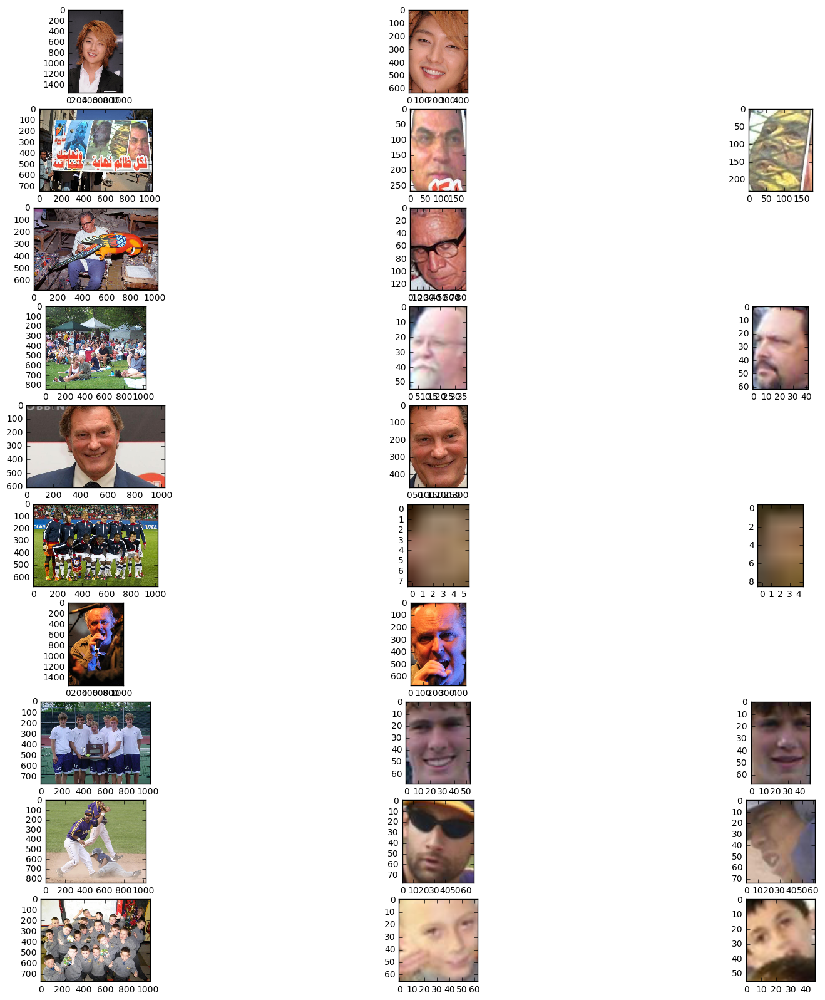

In [57]:
plt.figure(figsize=(20,20))
for i in range(10):
    x = random.randint(0,len(val_images))
    plt.subplot(10,3,i * 3 + 1)
    one_img = plt.imread('../data/WIDER_val/images/{}'.format(val_images[x]))
    plt.imshow(one_img)
    rectangles = val_bbs[x]
    for j,one_rect in enumerate(rectangles[:2]):
        x,y,w,h = one_rect[:4]
        plt.subplot(10,3,i * 3 + j + 2)
        plt.imshow(one_img[y:y+h,x:x+w])
    

In [7]:
%load_ext autoreload
%autoreload 2
import numpy as np
import sys
import os
sys.path.append('../common/')
import utils
import nets
from matplotlib import pyplot as plt
%matplotlib inline
import pandas as pd
import os
import time
import random
import cv2
plt.style.use('ggplot')

In [13]:
import pickle
import random
with open('../data/train_val.pkl','rb') as fhdl:
    (train_images,train_bbs,val_images,val_bbs) = pickle.load(fhdl)

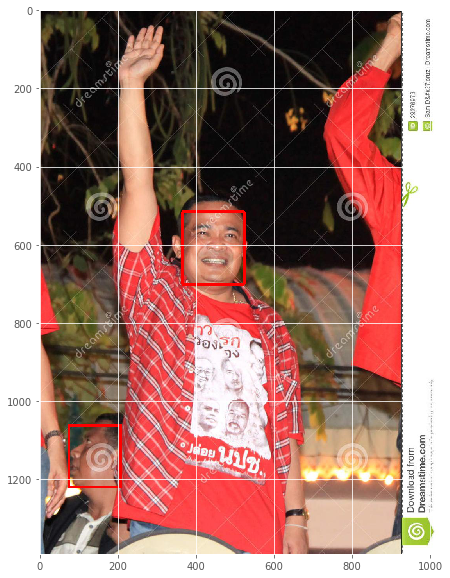

In [40]:
randindex = random.randint(0,len(train_images))
image,boxes = train_images[randindex],train_bbs[randindex]
plt.figure(figsize=(10,10))
img = plt.imread('../data/WIDER_train/images/' + image)
for box in boxes:
    x,y,w,h = box[:4]
    cv2.rectangle(img,(x,y),(x + w,y + h),(255,0,0),5)
plt.imshow(img)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f77b0ebcfd0>]],
      dtype=object)

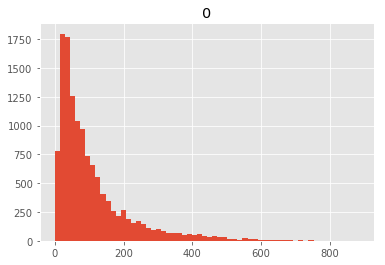

In [11]:
pd.DataFrame([i[0][2] for i in train_bbs]).hist(bins=60)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f77a04fd198>]],
      dtype=object)

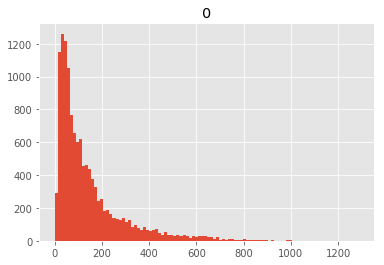

In [12]:
pd.DataFrame([i[0][3] for i in train_bbs]).hist(bins=100)

In [532]:
box_sizes = np.asarray([16,32,48,64,96,128,64 + 128,256,512])
box_tuple = []
for i in box_sizes:
    box_tuple.append([i,i])
    #box_tuple.append([i,int(1.4 * i)])
    #box_tuple.append([int(1.4 * i),i])
    #box_tuple.append([i,int(1.8 * i)])
    #box_tuple.append([int(1.8 * i),i])


In [533]:
box_tuple

[[16, 16],
 [32, 32],
 [48, 48],
 [64, 64],
 [96, 96],
 [128, 128],
 [192, 192],
 [256, 256],
 [512, 512]]

In [1002]:
def IOU(Reframe,GTframe):
    """
    自定义函数，计算两矩形 IOU，传入为均为矩形对角线，（x,y）  坐标。·
    """
    x1 = Reframe[0];
    y1 = Reframe[1];
    width1 = Reframe[2]-Reframe[0];
    height1 = Reframe[3]-Reframe[1];

    x2 = GTframe[0];
    y2 = GTframe[1];
    width2 = GTframe[2]-GTframe[0];
    height2 = GTframe[3]-GTframe[1];

    endx = max(x1+width1,x2+width2);
    startx = min(x1,x2);
    width = width1+width2-(endx-startx);

    endy = max(y1+height1,y2+height2);
    starty = min(y1,y2);
    height = height1+height2-(endy-starty);

    if width <=0 or height <= 0:
        ratio = 0 # 重叠率为 0 
    else:
        Area = width*height; # 两矩形相交面积
        Area1 = width1*height1; 
        Area2 = width2*height2;
        ratio = Area*1./(Area1+Area2-Area);
    # return IOU
    return ratio#,Reframe,GTframe

def twocord2centercord(thisx,thisy,thisx1,thisy1):
    this_cx = (thisx + thisx1) // 2
    this_cy = (thisy + thisy1) // 2
    this_w = (thisx1 - thisx)
    this_h = (thisy1 - thisy)
    return this_cx,this_cy,this_w,this_h

def get_four_tterms(targetcord,thiscord):
    thisx,thisy,thisx1,thisy1 = thiscord
    targetx,targety,targetx1,targety1 = targetcord
    
    this_cx,this_cy,this_w,this_h = twocord2centercord(thisx,thisy,thisx1,thisy1)
    target_cx,target_cy,target_w,target_h = twocord2centercord(targetx,targety,targetx1,targety1)
    
    tx = (target_cx - this_cx) / this_w
    ty = (target_cy - this_cy) / this_h
    tw = np.log(target_w / this_w)
    th = np.log(target_h / this_h)
    return tx,ty,tw,th

def generate_archors_for_one_image(one_image,boxes,box_tuple=None,ratio=16,threshold = 0.7):
    height,width = one_image.shape[:2]
    widthinds = width // ratio
    heightinds = height // ratio
    
    masks = np.zeros((1,widthinds,heightinds,len(box_tuple)))
    cls_target = np.zeros((1,widthinds,heightinds,len(box_tuple),2))
    reg_target = np.zeros((1,widthinds,heightinds,len(box_tuple),4))
    
    for one_box in boxes:
        maxiou = 0
        maxx,maxy,maxb = 0,0,0
        for boxindex,(bw,bh) in enumerate(box_tuple):
            for ix in range(widthinds):
                rx = ix * ratio + ratio // 2
                for iy in range(heightinds):
                    ry = iy * ratio + ratio // 2
                    bbx_here = [rx - bw // 2,ry - bh // 2,rx + bw // 2,ry + bw // 2]
                
                    x,y,w,h = one_box[:4]
                    onebbx = (x,y,x + w,y + h)
                    boxiou = IOU(onebbx,bbx_here)
                    
                    if boxiou > maxiou:
                        tx,ty,tw,th = get_four_tterms(onebbx[:4],bbx_here)
                        reg_target[0,ix,iy,boxindex] = np.asarray([tx,ty,tw,th])
                        maxiou = boxiou
                        maxx = ix
                        maxy = iy
                        maxb = boxindex
                        
                    if boxiou < 0.3:
                        masks[0,ix,iy,boxindex] = 1
                        cls_target[0,ix,iy,boxindex,0] = 1
                    elif boxiou > threshold:
                        #print(bbx_here,onebbx)
                        masks[0,ix,iy,boxindex] = 1
                        cls_target[0,ix,iy,boxindex,1] = 1
                        tx,ty,tw,th = get_four_tterms(onebbx[:4],bbx_here)
                        reg_target[0,ix,iy,boxindex] = np.asarray([tx,ty,tw,th])
                    else:
                        masks[0,ix,iy,boxindex] = 0
        if maxiou < threshold:
            #print(maxiou)
            masks[0,maxx,maxy,maxb] = 1
            cls_target[0,maxx,maxy,maxb,1] = 1
            cls_target[0,maxx,maxy,maxb,0] = 0
    return masks,cls_target,reg_target

In [986]:
box_tuple

[[16, 16],
 [32, 32],
 [48, 48],
 [64, 64],
 [96, 96],
 [128, 128],
 [192, 192],
 [256, 256],
 [512, 512]]

In [987]:
print(image)

37--Soccer/37_Soccer_soccer_ball_37_64.jpg


In [988]:
np.average(cls_target[:,:,:,:,])

0.5002387152777777

[672, 0, 768, 96] (678, 10, 766, 108)
[384, 96, 480, 192] (386, 86, 470, 184)
[-0.04166667 -0.09375    -0.13353139  0.02061929]
[ 0.09375    -0.11458333  0.06062462  0.13613217]
[ 0.02083333  0.11458333 -0.08701138  0.02061929]


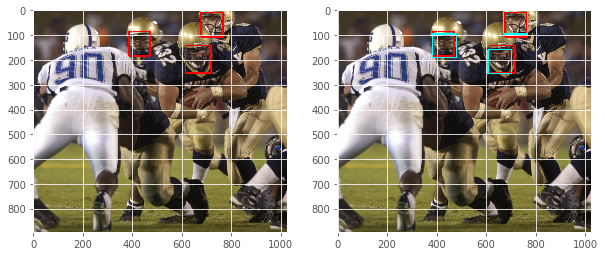

In [995]:

randindex = random.randint(0,len(train_images))
ratio = 32
image,boxes = train_images[randindex],train_bbs[randindex]
plt.figure(figsize=(10,10))
img = plt.imread('../data/WIDER_train/images/' + image)
for box in boxes:
    x,y,w,h = box[:4]
    cv2.rectangle(img,(x,y),(x + w,y + h),(255,0,0),5)

plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img)

masks,cls_target,reg_target = generate_archors_for_one_image(img,boxes,ratio=ratio,box_tuple=box_tuple)
plt.subplot(1,2,2)
for _,idx,idy,idbox in np.asarray(np.where(cls_target[:,:,:,:,1] == 1)).T:
    boxw,boxh = box_tuple[idbox]
    idx = idx * ratio + ratio // 2
    idy = idy * ratio + ratio // 2
    bbwidths.append(boxw)
    bbheights.append(boxh)
    #print(boxw,boxh)
    cv2.rectangle(img,(idx - boxw // 2,idy - boxh // 2),(idx + boxw // 2,idy + boxh // 2),(0,256,256),4)
    print(reg_target[0,idx // ratio,idy // ratio,idbox])
plt.imshow(img)

In [964]:
np.average(masks)

0.9988715277777778

In [965]:
boxw,w,boxh,h,  idx,x + w // 2,idy,y + h // 2

(64, 71, 64, 97, 624, 287, 208, 586)

In [966]:
np.log(622 / 512)

0.19461546769967167

In [967]:
bbwidths = []
bbheights = []

In [968]:
box

[252, 538, 71, 97, 0, 0, 0, 0, 0, 0]

In [969]:
np.asarray(np.where(cls_target[:,:,:,:,1] == 1)).T


array([[ 0,  8, 18,  4],
       [ 0, 19,  6,  3]])

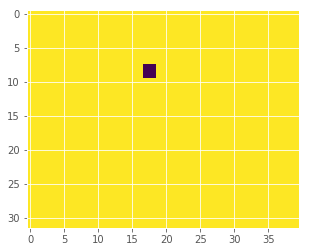

In [972]:
plt.imshow(masks[0,:,:,3])

In [973]:
masks.shape

(1, 32, 40, 9)

In [8]:
len(train_images)

12881

In [975]:
reg_target[0,idx // ratio,idy // ratio,idbox]

array([-0.03125   ,  0.0625    ,  0.03077166,  0.15860503])

In [620]:
pb = utils.ProgressBar(worksum=len(train_images))
pb.startjob()

for index in range(len(train_images)):
    
    image,boxes = train_images[index],train_bbs[index]
    plt.figure(figsize=(10,10))
    



    masks,cls_target,reg_target = generate_archors_for_one_image(img,boxes,ratio=ratio,box_tuple=box_tuple)

    break

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f76eb822390>]],
      dtype=object)

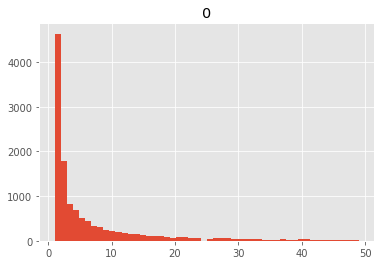

In [674]:
pd.DataFrame([len(i) for i in train_bbs if len(i) < 50]).hist(bins=50)

In [14]:
pb = utils.ProgressBar(worksum=len(train_images))
pb.startjob()
out_train_image = []
out_train_bbs = []
out_imgsize = []
out_masks = []
out_cls_target = []
out_reg_target = []
ratio = 32
for one_imageurl,one_bbs in zip(train_images,train_bbs):
    if len(one_bbs) > 30:
        pb.complete(1)
        continue
    #img = plt.imread('../data/WIDER_train/images/' + one_imageurl)
    #masks,cls_target,reg_target = generate_archors_for_one_image(img,one_bbs,ratio=ratio,box_tuple=box_tuple)
    out_train_image.append(one_imageurl)
    out_train_bbs.append(one_bbs)
    #out_masks.append(masks)
    #out_imgsize.append(img.shape)
    #out_cls_target.append(cls_target)
    #out_reg_target.append(reg_target)
    pb.complete(1)

 18.71 % [=========>-----------------------------------------] 2410/12881 	 used:0s eta:0 s

 38.38 % [===================>-------------------------------] 4944/12881 	 used:0s eta:0 s

 58.02 % [=============================>---------------------] 7473/12881 	 used:0s eta:0 s

 76.53 % [======================================>------------] 9858/12881 	 used:0s eta:0 s

 94.99 % [===============================================>---] 12236/12881 	 used:1s eta:0 s

 99.99 % [=================================================>-] 12880/12881 	 used:1s eta:0 s

In [17]:
with open('../training/data/training_data_box.pkl','wb') as whdl:
    pickle.dump(out_train_bbs,whdl)

In [15]:
out_train_bbs[0],len(out_train_bbs)

([[449, 330, 122, 149, 0, 0, 0, 0, 0, 0]], 11854)

In [1004]:
out_train_image = np.asarray(out_train_image)

out_train_bbs = np.asarray(out_train_bbs)
out_imgsize = out_imgsize
out_masks = out_masks
out_cls_target = out_cls_target
out_reg_target = out_reg_target

In [1005]:
with open('../data/training_data_ratio32.pkl','wb') as whdl:
    pickle.dump((out_train_image,out_train_bbs,out_imgsize,out_masks,out_cls_target,out_reg_target),whdl)

In [1006]:
cls_target.shape,reg_target.shape

((1, 32, 21, 9, 2), (1, 32, 21, 9, 4))

In [18]:
pb = utils.ProgressBar(worksum=len(val_images))
pb.startjob()
out_train_image = []
out_train_bbs = []
out_imgsize = []
out_masks = []
out_cls_target = []
out_reg_target = []
ratio = 32
for one_imageurl,one_bbs in zip(val_images,val_bbs):
    if len(one_bbs) > 30:
        pb.complete(1)
        continue
    #img = plt.imread('../data/WIDER_val/images/' + one_imageurl)
    #masks,cls_target,reg_target = generate_archors_for_one_image(img,one_bbs,ratio=ratio,box_tuple=box_tuple)
    out_train_image.append(one_imageurl)
    out_train_bbs.append(one_bbs)
    #out_masks.append(masks)
    #out_imgsize.append(img.shape)
    #out_cls_target.append(cls_target)
    #out_reg_target.append(reg_target)
    pb.complete(1)

 70.13 % [===================================>---------------] 2263/3227 	 used:0s eta:0 s

 99.97 % [=================================================>-] 3226/3227 	 used:0s eta:0 s

In [19]:
with open('../training/data/val_data_box.pkl','wb') as whdl:
    pickle.dump(out_train_bbs,whdl)

In [1008]:
out_train_image = np.asarray(out_train_image)

out_train_bbs = np.asarray(out_train_bbs)
out_imgsize = out_imgsize
out_masks = out_masks
out_cls_target = out_cls_target
out_reg_target = out_reg_target

In [1009]:
with open('../data/val_data_ratio32.pkl','wb') as whdl:
    pickle.dump((out_train_image,out_train_bbs,out_imgsize,out_masks,out_cls_target,out_reg_target),whdl)

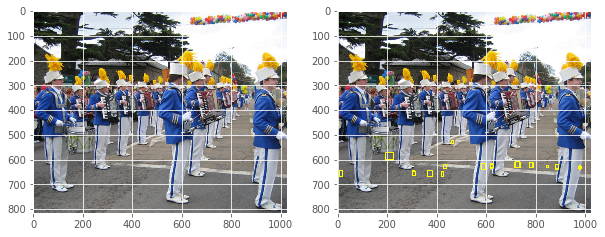

In [999]:
cls_target = out_cls_target[4]
reg_target = out_reg_target[4]
one_mask = out_masks[4]
sample_image = plt.imread('../data/WIDER_val/images/{}'.format(out_train_image[4]))
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(sample_image)
for _,idx,idy,idbox in np.asarray(np.where(cls_target[:,:,:,:,1] == 1)).T:
    rx,ry = idx * 32 + 16,idy * 32 + 16
    boxw,boxh = box_tuple[idbox]
    w_delta,h_delta,w_rat,h_rat = reg_target[0,idx,idy,idbox]
    x_center = int(rx + boxw * w_delta)
    y_center = int(ry + boxh * h_delta)
    
    x_width = int(boxw * np.exp(w_rat))
    y_height = int(boxh * np.exp(h_rat))
    
    cv2.rectangle(sample_image,(x_center - x_width // 2,y_center - y_height // 2),(x_center + x_width // 2,y_center + y_height // 2),(256,256,0),4)
plt.subplot(1,2,2)
plt.imshow(sample_image)